In [2]:
from typing import Dict, Tuple
from tqdm import tqdm
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import models, transforms
from torchvision.utils import save_image, make_grid
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
import numpy as np
from IPython.display import HTML
import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'
from diffusion_utilities_v3 import * 

np.set_printoptions(suppress = True)

In [3]:
def normalize(x):
    x = x.reshape(-1,3)
    _max = np.max(x)
    _min = np.min(x)
    return ((x - (_max + _min) / 2) / (_max - _min) * 2).reshape(32,32,3)

def normalize2(x):
    x = x.reshape(-1,3)
    _max = np.max(x)
    _min = np.min(x)
    return ((x - (_max + _min) / 2) / (_max - _min) * 2)



def standardize(x):
    x = x.reshape(-1,3)
    return ((x - np.mean(x,axis = 0)) / np.std(x,axis = 0)).reshape(32,32,3)

def standardize2(x):
    x = x.reshape(-1,3)
    return ((x - np.mean(x,axis = 0)) / np.std(x,axis = 0))


def sortby_x(arr):
    seq = np.argsort(arr[:,0])
    print(seq[:5])
    return arr[seq]

In [4]:
cube_arrs = []
target_arrs = []



polycube_512_cube = np.loadtxt(r"../v_cos/512_cube.txt")
polycube_512_torus = np.loadtxt(r"../v_cos/512_torus_h.txt")
polycube_512_torus_x_hole = np.loadtxt(r"../v_cos/512_torus_h_1x_oriented_hole.txt")
polycube_512_torus_y_hole = np.loadtxt(r"../v_cos/512_torus_h_1y_oriented_hole.txt")


target_512_cube = np.loadtxt(r"../v_cos/512_new_cube_target.txt")
target_512_torus = np.loadtxt(r"../v_cos/512_torus_h_target.txt")
target_512_torus_x_hole = np.loadtxt(r"../v_cos/512_torus_h_target_x_oriented_hole.txt")
target_512_torus_y_hole = np.loadtxt(r"../v_cos/512_torus_h_target_y_oriented_hole.txt")

polycube_512_cube = sortby_x(normalize2(standardize2(polycube_512_cube)))
polycube_512_torus = sortby_x(normalize2(standardize2(polycube_512_torus)))
polycube_512_torus_x_hole = sortby_x(normalize2(standardize2(polycube_512_torus_x_hole)))
polycube_512_torus_y_hole = sortby_x(normalize2(standardize2(polycube_512_torus_y_hole)))

target_512_cube = sortby_x(normalize2(standardize2(target_512_cube)))
target_512_torus = sortby_x(normalize2(standardize2(target_512_torus)))
target_512_torus_x_hole = sortby_x(normalize2(standardize2(target_512_torus_x_hole)))
target_512_torus_y_hole = sortby_x(normalize2(standardize2(target_512_torus_y_hole)))

polycube_512_cube_back = np.vstack([polycube_512_cube / 2 - np.array([0.5,0,0]),np.zeros([512,3])])
polycube_512_cube_front = np.vstack([np.zeros([512,3]),polycube_512_cube / 2 + np.array([0.5,0,0])])
polycube_512_torus_back = np.vstack([polycube_512_torus / 2 - np.array([0.5,0,0]),np.zeros([512,3])])
polycube_512_torus_front = np.vstack([np.zeros([512,3]),polycube_512_torus / 2 + np.array([0.5,0,0])])
polycube_512_torus_x_hole_back = np.vstack([polycube_512_torus_x_hole / 2 - np.array([0.5,0,0]),np.zeros([512,3])])
polycube_512_torus_x_hole_front = np.vstack([np.zeros([512,3]),polycube_512_torus_x_hole / 2 + np.array([0.5,0,0])])
polycube_512_torus_y_hole_back = np.vstack([polycube_512_torus_y_hole / 2 - np.array([0.5,0,0]),np.zeros([512,3])])
polycube_512_torus_y_hole_front = np.vstack([np.zeros([512,3]),polycube_512_torus_y_hole / 2 + np.array([0.5,0,0])])
polycube_1024_double_cube = np.vstack([polycube_512_cube / 2 - np.array([0.5,0,0]),polycube_512_cube / 2 + np.array([0.5,0,0])])



target_512_cube_back = np.vstack([target_512_cube / 2 - np.array([0.5,0,0]),np.zeros([512,3])])
target_512_cube_front = np.vstack([np.zeros([512,3]),target_512_cube / 2 + np.array([0.5,0,0])])
target_512_torus_back = np.vstack([target_512_torus / 2 - np.array([0.5,0,0]),np.zeros([512,3])])
target_512_torus_front = np.vstack([np.zeros([512,3]),target_512_torus / 2 + np.array([0.5,0,0])])
target_512_torus_x_hole_back = np.vstack([target_512_torus_x_hole / 2 - np.array([0.5,0,0]),np.zeros([512,3])])
target_512_torus_x_hole_front = np.vstack([np.zeros([512,3]),target_512_torus_x_hole / 2 + np.array([0.5,0,0])])
target_512_torus_y_hole_back = np.vstack([target_512_torus_y_hole / 2 - np.array([0.5,0,0]),np.zeros([512,3])])
target_512_torus_y_hole_front = np.vstack([np.zeros([512,3]),target_512_torus_y_hole / 2 + np.array([0.5,0,0])])
target_1024_double_cube = np.vstack([target_512_cube / 2 - np.array([0.5,0,0]),target_512_cube / 2 + np.array([0.5,0,0])])


cube_arrs.append(polycube_512_cube_back.reshape(32,32,3))
cube_arrs.append(polycube_512_cube_front.reshape(32,32,3))
cube_arrs.append(polycube_512_torus_back.reshape(32,32,3))
cube_arrs.append(polycube_512_torus_front.reshape(32,32,3))
cube_arrs.append(polycube_512_torus_x_hole_back.reshape(32,32,3))
cube_arrs.append(polycube_512_torus_x_hole_front.reshape(32,32,3))
cube_arrs.append(polycube_512_torus_y_hole_back.reshape(32,32,3))
cube_arrs.append(polycube_512_torus_y_hole_front.reshape(32,32,3))
cube_arrs.append(polycube_1024_double_cube.reshape(32,32,3))

target_arrs.append(polycube_512_cube_back.reshape(32,32,3))
target_arrs.append(polycube_512_cube_front.reshape(32,32,3))
target_arrs.append(polycube_512_torus_back.reshape(32,32,3))
target_arrs.append(polycube_512_torus_front.reshape(32,32,3))
target_arrs.append(polycube_512_torus_x_hole_back.reshape(32,32,3))
target_arrs.append(polycube_512_torus_x_hole_front.reshape(32,32,3))
target_arrs.append(polycube_512_torus_y_hole_back.reshape(32,32,3))
target_arrs.append(polycube_512_torus_y_hole_front.reshape(32,32,3))
target_arrs.append(polycube_1024_double_cube.reshape(32,32,3))





polycubes = cube_arrs[:]


labels = np.zeros([9,29])
for i in range(8):
    labels[i][4 * i] = 1
labels[8][0] = 1
labels[8][4] = 1


[  0 308 309 310 311]
[389 390 373 372 466]
[423   0 275 288 291]
[389 390 373 372 466]
[324 332 323 331 340]
[223 383 382 381 380]
[196 232 272 418 417]
[223 383 382 381 380]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


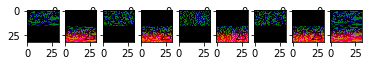

In [5]:
for i in range(9):
    plt.subplot(1,9,i + 1)
    plt.imshow(cube_arrs[i])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


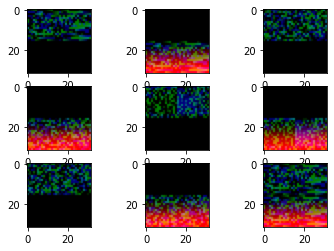

In [6]:
for i in range(9):
    plt.subplot(3,3,i + 1)
    plt.imshow(cube_arrs[i])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


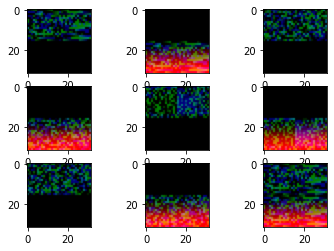

In [7]:
for i in range(9):
    plt.subplot(3,3,i + 1)
    plt.imshow(target_arrs[i])

In [8]:
class Unet(nn.Module):
    def __init__(self, in_channels, n_filters=256, context_dim=10, height=28):  
        super(Unet, self).__init__()

        # number of input channels, number of intermediate filters and number of classes
        self.in_channels = in_channels
        self.n_filters = n_filters
        self.context_dim = context_dim
        self.h = height  #assume h == w. must be divisible by 4, so 28,24,20,16...

        # Initialize the initial convolutional layer
        self.init_conv = ResidualConvBlock(in_channels, n_filters, is_res=True)

        # Initialize the down-sampling path of the U-Net with two levels
        self.down1 = UnetDown(n_filters, n_filters)        # down1 #[batch size, 64, 16, 16]
        self.down2 = UnetDown(n_filters, 2 * n_filters)    # down2 #[batch size, 128, 8,  8]
        
         # original: self.to_vec = nn.Sequential(nn.AvgPool2d(7), nn.GELU())
            
        
        self.to_vec = nn.Sequential(nn.AvgPool2d((8)), nn.GELU())   #8 or self.h / 4

        # Embed the timestep and context labels with a one-layer fully connected neural network
        self.timeembed1 = EmbedFC(1, 2*n_filters)
        self.timeembed2 = EmbedFC(1, 1*n_filters)
        self.contextembed1 = EmbedFC(context_dim, 2*n_filters)
        self.contextembed2 = EmbedFC(context_dim, 1*n_filters)

        # Initialize the up-sampling path of the U-Net with three levels
        self.up0 = nn.Sequential(
            nn.ConvTranspose2d(2 * n_filters, 2 * n_filters, self.h//4, self.h//4), # up-sample 
            nn.GroupNorm(8, 2 * n_filters), # normalize                        
            nn.ReLU(),
        )
        self.up1 = UnetUp(4 * n_filters, n_filters)
        self.up2 = UnetUp(2 * n_filters, n_filters)

        # Initialize the final convolutional layers to map to the same number of channels as the input image
        self.out = nn.Sequential(
            nn.Conv2d(2 * n_filters, n_filters, 3, 1, 1), # reduce number of filters   #in_channels, out_channels, kernel_size, stride=1, padding=0
            nn.GroupNorm(8, n_filters), # normalize
            nn.ReLU(),
            nn.Conv2d(n_filters, self.in_channels, 3, 1, 1), # map to same number of channels as input
        )

    def forward(self, x, t, c=None):
        """
        x : (batch, n_filters, h, w) : input image
        t : (batch, context_dim)      : time step
        c : (batch, n_classes)    : context label
        """
        # x is the input image, c is the context label, t is the timestep, context_mask says which samples to block the context on

        # pass the input image through the initial convolutional layer
        x = self.init_conv(x)
        # pass the result through the down-sampling path
        down1 = self.down1(x)       #[batch size, n_filters64, 16, 16]
        down2 = self.down2(down1)   #[batch size, 2*n_filters, 8,  8]
        # convert the filters to a vector and apply an activation
        hiddenvec = self.to_vec(down2)
        #print(f"down1 {down1.shape},down2 {down2.shape},hiddenvec {hiddenvec.shape}")
        # mask out context if context_mask == 1
        if c is None:
            c = torch.zeros(x.shape[0], self.context_dim).to(x)
            
        # embed context and timestep
        c_embd1 = self.contextembed1(c).view(-1, self.n_filters * 2, 1, 1)     # (batch size, 2*n_filters, 1,1)
        t_embd1 = self.timeembed1(t).view(-1, self.n_filters * 2, 1, 1)
        c_embd2 = self.contextembed2(c).view(-1, self.n_filters, 1, 1)
        t_embd2 = self.timeembed2(t).view(-1, self.n_filters, 1, 1)
        #print(f"uunet forward: c_embd1 {c_embd1.shape}. t_embd1 {t_embd1.shape}, c_embd2 {c_embd2.shape}. t_embd2 {t_embd2.shape}")


        up1 = self.up0(hiddenvec)
        #print(f"up1 {up1.shape}")
        up2 = self.up1(c_embd1 * up1 + t_embd1, down2)  # add and multiply embeddings
        #print(f"up2 {up2.shape}")
        up3 = self.up2(c_embd2 * up2 + t_embd2, down1)
        #print(f"up3 {up3.shape}")
        out = self.out(torch.cat((up3, x), 1))
        return out


In [9]:
# hyperparameters

# diffusion hyperparameters
timesteps = 500
beta1 = 1e-4
beta2 = 0.02

# network hyperparameters
device = torch.device("cuda:0" if torch.cuda.is_available() else torch.device('cpu'))
n_filters = 64 # 64 hidden dimension feature
context_dim = 29 # context vector is of size 29

height = 32 #The image size is 32 * 32
save_dir = '../weights/'

# training hyperparameters
batch_size = 200
n_epoch = 400
lrate=1e-3

In [10]:
np.set_printoptions(suppress = True)
# construct DDPM noise schedule
b_t = (beta2 - beta1) * torch.linspace(0, 1, timesteps + 1, device=device) + beta1
a_t = 1 - b_t
ab_t = torch.cumsum(a_t.log(), dim=0).exp()    
ab_t[0] = 1

a_t_np = a_t.detach().cpu().numpy()
b_t_np = b_t.detach().cpu().numpy()
ab_t_np = ab_t.detach().cpu().numpy()





"""
calculate Q_t with different time steps

"""

coeff_inference_Q_t = [np.sum([(1 - a_t_np[j])** 0.5 * np.prod([a_t_np[i] for i in range(j + 1,k + 1)]) ** 0.5 for j in range(1,k + 1)]) for k in range(1,timesteps + 1)]
coeff_inference_Q_t[0:0] = [0] 


"""
get the p value
"""
ps = (np.array(target_arrs) / coeff_inference_Q_t[-1]).transpose([0,3,1,2])

In [16]:
"""
repeat the dataset to ensure the diversity
"""

repeat_counts = 1280

label = labels.repeat(repeat_counts,axis=0)
np.save("../training_data/contexts.npy",label)

polycubes = np.array(polycubes)
polycubes = polycubes.repeat(repeat_counts,axis = 0)
polycubes = np.uint8((polycubes + 1) / 2 * 255)
np.save("../training_data/polycubes.npy",polycubes,"%d")

ps_dataset = ps.repeat(repeat_counts,axis = 0)
np.save("../training_data/ps.npy",ps_dataset)

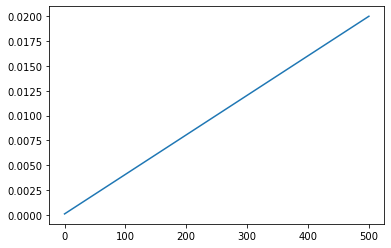

In [17]:
plt.plot(b_t.detach().cpu().numpy())

In [18]:
# construct model
nn_model = Unet(in_channels=3, n_filters=n_filters, context_dim=context_dim, height=height).to(device)

In [20]:
dataset = CustomDataset("../training_data/polycubes.npy","../training_data/contexts.npy","../training_data/ps.npy",transform,null_context=False)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=1)
optim = torch.optim.Adam(nn_model.parameters(), lr=lrate)

sprite shape: (11520, 32, 32, 3)
labels shape: (11520, 29)


In [21]:
# helper function: perturbs an image to a specified noise level

def perturb_input(x, t, noise, p):
    #print("x,q shape",x.shape,Q_t.shape)
    return ab_t.sqrt()[t, None, None, None] * x + (1 - ab_t[t, None, None, None]).sqrt() * noise + torch.Tensor(coeff_inference_Q_t).to(device)[t,None,None,None] * p 

    


In [23]:
# training without context code

# set into train mode
nn_model.train()

L = []

for ep in range(n_epoch):
    print(f'epoch {ep}')
    
    # linearly decay learning rate
    optim.param_groups[0]['lr'] = lrate*(1-ep/n_epoch)
    Training_Loss = []
    pbar = tqdm(dataloader, mininterval=2 )
    for x, c , p in pbar:   # x: images  # c : contexts # p : pieces of Q_t
        optim.zero_grad()
        x = x.to(device)
        c = c.to(x)
        
        # randomly mask out c
        context_mask = torch.bernoulli(torch.zeros(c.shape[0]) + 0.9).to(device)
        c = c * context_mask.unsqueeze(-1)
        
        # perturb data
 
        t = torch.randint(1, timesteps + 1, (x.shape[0],)).to(device) 
        newp = torch.Tensor(p.float()).to(device)
        p = p.float().to(device)
        newt = ((1 - ab_t[t]).sqrt() / (1 - a_t[t]).sqrt())
        newt = newt[:,None,None,None]
        
        noise = torch.randn_like(x) 
        x_pert = perturb_input(x, t, noise,p)
        #print(x_pert.shape)
        
        # use network to recover noise
        pred_noise = nn_model(x_pert, t / timesteps, c = c) 
        abt_coeff = ab_t[-1].repeat(3,32,32,x.shape[0]).permute(3,0,1,2).sqrt() 
        
        # loss is mean squared error between the predicted and true noise
        loss = F.mse_loss(pred_noise, noise + newp.to(device) * newt * abt_coeff)
        loss.backward()
        
        Training_Loss.append(loss.detach().cpu().numpy() / noise.shape[0])
        optim.step()
    Loss = np.mean(Training_Loss)
    print(f"Loss,{Loss}")
    L.append(Loss)
    # save model periodically
    if ep%4==0 or ep == int(n_epoch-1):
        if not os.path.exists(save_dir):
            os.mkdir(save_dir)
        torch.save(nn_model.state_dict(), save_dir + f"model_{ep}.pth")
        print('saved model at ' + save_dir + f"model_{ep}.pth")

epoch 0


 19%|███████████████▌                                                                  | 11/58 [00:08<00:35,  1.32it/s]


KeyboardInterrupt: 

In [24]:
# helper function; removes the predicted noise (but adds some noise back in to avoid collapse)
def denoise_add_noise(x, t, pred_noise, z=None):
    if z is None:
        z = torch.randn_like(x)
    noise = b_t.sqrt()[t] * z 
    mean = (x - pred_noise * ((1 - a_t[t]) / (1 - ab_t[t]).sqrt())) / a_t[t].sqrt()
    return mean + noise

In [25]:
# sample using standard algorithm
@torch.no_grad()
def sample_ddpm_without_noise(n_sample, context, init_arr, save_rate=20):  
    samples = (torch.zeros(n_sample, 3, height, height) + torch.Tensor(init_arr.transpose([2,0,1]))).to(device)
    print(samples.shape)
    # array to keep track of generated steps for plotting
    intermediate = [] 
    count = 1
    for i in range(timesteps, 0, -1):
        print(f'sampling timestep {i:3d}', end='\r')

        # reshape time tensor
        t = torch.tensor([i / timesteps])[:, None, None, None].to(device)

        # sample some random noise to inject back in. For i = 1, don't add back in noise
        z = torch.randn_like(samples) if i > 1 else 0

        eps = nn_model(samples, t, c = context)    # predict noise e_(x_t,t)
        samples = denoise_add_noise(samples, i, eps, z)
        if i % save_rate ==0 or i==timesteps or i<8:
            count += 1
            
            print("i ",i)
            intermediate.append(samples.detach().cpu().numpy())

    intermediate = np.stack(intermediate)
    return samples, intermediate

In [26]:
def show_images(imgs, nrow=2):
    _, axs = plt.subplots(nrow, imgs.shape[0] // nrow, figsize=(4,2 ))
    axs = axs.flatten()
    for img, ax in zip(imgs, axs):
        img = (img.permute(1, 2, 0).clip(-1, 1).detach().cpu().numpy() + 1) / 2
        ax.set_xticks([])
        ax.set_yticks([])
        ax.imshow(img)
    plt.show()

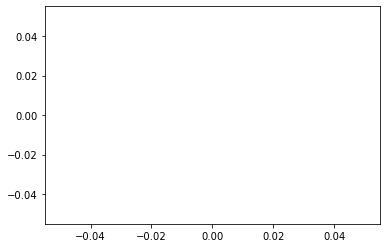

In [27]:
plt.plot(L,label = "Loss")

In [28]:
# load in model weights and set to eval mode
nn_model.load_state_dict(torch.load(f"{save_dir}/model_399_.pth", map_location=device))
nn_model.eval()
print("Loaded in Model")

Loaded in Model


In [29]:
contexts = np.zeros([9,29])
for i in range(8):
    contexts[i][4 * i] = 1
contexts[8][0] = 1
contexts[8][4] = 1

d = np.array(str(np.loadtxt("../context.txt","str")).split(",")).astype("int")

lb = np.zeros([9,29])
if d[0] < 0:
    lb = contexts[d[1]]
else:
    lb = contexts[d[0]] + contexts[d[1]]

#lb = str(np.loadtxt("./context.txt","str"))
#lb = [int(item) for item in lb]
#lb = np.array(lb)

In [30]:
if np.sum(lb) == 1:
    test_arr = np.loadtxt(r"../tmp/test_v_co.txt")
    test_arr = normalize2(test_arr) / 2
    test_arr = sortby_x(test_arr)

    test_arr += np.array([0.5,0,0])
    test_arr = np.vstack([np.zeros([512,3]),test_arr])
    test_arr = test_arr.reshape(32,32,3).astype("float")
else:
    test_arr = np.loadtxt(r"../tmp/test_v_co.txt")
    test_arr = sortby_x(test_arr)   
    test_arr = normalize(test_arr.reshape(32,32,3).astype("float"))

[260 127 381   3 262]


In [31]:
plt.clf()
ctx = torch.Tensor(lb).repeat(32).to(device=device).float()

denoising_sample,intermediate_ddpm = sample_ddpm_without_noise(32,ctx,test_arr)
animation_ddpm2 = plot_sample(intermediate_ddpm,32,4,save_dir, "ani_run", None, save=False)
HTML(animation_ddpm2.to_jshtml())

torch.Size([32, 3, 32, 32])
i  500ng timestep 500
i  480ng timestep 480
i  460ng timestep 460
i  440ng timestep 440
i  420ng timestep 420
i  400ng timestep 400
i  380ng timestep 380
i  360ng timestep 360
i  340ng timestep 340
i  320ng timestep 320
i  300ng timestep 300
i  280ng timestep 280
i  260ng timestep 260
i  240ng timestep 240
i  220ng timestep 220
i  200ng timestep 200
i  180ng timestep 180
i  160ng timestep 160
i  140ng timestep 140
i  120ng timestep 120
i  100ng timestep 100
i  80ing timestep  80
i  60ing timestep  60
i  40ing timestep  40
i  20ing timestep  20
i  7ling timestep   7
i  6ling timestep   6
i  5ling timestep   5
i  4ling timestep   4
i  3ling timestep   3
i  2ling timestep   2
i  1ling timestep   1


<Figure size 432x288 with 0 Axes>

In [32]:
case0 = intermediate_ddpm[:,24,:,:,:] #choose the result you prefer
case0 = np.insert(case0,0,test_arr.transpose([2,0,1]),axis = 0)
np.savetxt("../tmp/case0.txt",case0.reshape(33,-1))